<a href="https://colab.research.google.com/github/MarcVodoleev/LFVU/blob/main/LFVU_Optimizer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install scikit-dimension git+https://github.com/IlyaTrofimov/RTD.git git+https://github.com/simonzhang00/ripser-plusplus.git

  Cloning https://github.com/IlyaTrofimov/RTD.git to /tmp/pip-req-build-ik2_kx4k
  Running command git clone --filter=blob:none --quiet https://github.com/IlyaTrofimov/RTD.git /tmp/pip-req-build-ik2_kx4k
  Resolved https://github.com/IlyaTrofimov/RTD.git to commit f47c99e4784173b8b43441b61f71f9d585f85d52
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/simonzhang00/ripser-plusplus.git to /tmp/pip-req-build-ab5a5t39
  Running command git clone --filter=blob:none --quiet https://github.com/simonzhang00/ripser-plusplus.git /tmp/pip-req-build-ab5a5t39
  Resolved https://github.com/simonzhang00/ripser-plusplus.git to commit 30243c0c752de26d7fdf6e41f08bf7b840ca4744
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 4.3 MB/s eta 0:00:00
  Created wheel for rtd: filename=rtd-1.0-py3-none-any.whl size=10217 sha256=b07f7a1ada0dda234f40997cddf16bf150f280022be6a88b2b1d50

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import rtd
import skdim
import time
import torch
import torch.nn as nn
import typing as tp
import umap

from scipy.signal import correlate
from scipy.spatial import distance_matrix
from scipy.stats import wasserstein_distance
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

class LFVUOptimizer: # TODO: add dimension reducer to arguments
    def __init__(self,
                 X: tp.Union[np.array, torch.tensor],
                 target_dim: int = 2,
                 k: int = 10,
                 lr : float = 0.01,
                 epochs : int = 100,
                 init_method: str = 'tsne',
                 initial_emb: tp.Optional[tp.Union[np.array, torch.tensor]] = None,
                 reducer = None,
                 device: str = 'auto'):
        """
        LFVU dimension reduction algorithm

        Parameters:
        -----------
        X : numpy array or torch tensor
            Initial data (N x n)
        target_dim : int
            Target dimension
        k : int
            Number of nearest neighbors for the algorithm
        lr : float
            Learning rate
        epochs : int
            Number of epochs
        init_method : str
            Method for initialization: 'pca', 'random', 'tsne', 'umap'
        device : str
            'cpu' or 'cuda'
        """
        if device == 'auto':
          device = "cuda" if torch.cuda.is_available() else "cpu"
        assert device in ["cpu", "cuda"], "Incorrect device name"
        self.device = device
        print(f"Using device {self.device}")

        if isinstance(X, np.ndarray):
            self.X = torch.tensor(X, dtype=torch.float32).to(device)
        else:
            self.X = X.to(device)

        self.N, self.orig_dim = self.X.shape
        self.k = k
        self.target_dim = target_dim
        self.lr = lr
        self.epochs = epochs

        assert self.k < self.N, "k should be less than total number of samples."

        self.Y = self._initialize_Y(init_method, initial_emb)
        self.Y_0 = self.Y.detach().cpu().numpy()
        self.Y.requires_grad_(True)

        self.neighbors_X = self._compute_neighbors_X()

        self.loss_history = []
        self.kl_history = []
        self.emb_history = {}
        self.lfvu_history = {}

    def _initialize_Y(self, method, initial_emb=None):
        """Initialization of low-dimensional representation"""
        init_time = time.time()
        if method == 'pca':
            X_np = self.X.cpu().numpy()
            pca = PCA(n_components=self.target_dim)
            Y_init = pca.fit_transform(X_np)
            return torch.tensor(Y_init, dtype=torch.float32,
                               device=self.device, requires_grad=True)

        elif method == 'random':
            return torch.randn(self.N, self.target_dim,
                              device=self.device, requires_grad=True)

        elif method == 'tsne':
            X_np = self.X.cpu().numpy()
            tsne = TSNE(n_components=self.target_dim, perplexity=30,
                       random_state=42)
            Y_init = tsne.fit_transform(X_np)
            return torch.tensor(Y_init, dtype=torch.float32,
                               device=self.device, requires_grad=True)

        elif method == 'umap':
            X_np = self.X.cpu().numpy()
            reducer = umap.UMAP(n_components=self.target_dim, random_state=42)
            Y_init = reducer.fit_transform(X_np)
            return torch.tensor(Y_init, dtype=torch.float32,
                                device=self.device, requires_grad=True)

        elif method == "from_emb":
            return torch.tensor(initial_emb, dtype=torch.float32,
                                device=self.device, requires_grad=True)

        else:
            raise ValueError(f"Неизвестный метод инициализации: {method}")

        print(f"Initialization time: {time.time() - init_time:4f} s")

    def _compute_neighbors_X(self):
        """Finds k nearest neighbors in the initial space"""
        X_np = self.X.detach().cpu().numpy()
        knn = NearestNeighbors(n_neighbors=self.k+1)  # +1 to later exclude THE point
        knn.fit(X_np)
        distances, indices = knn.kneighbors(X_np)

        # Excluding THE point
        indices = indices[:, 1:self.k+1]
        distances = distances[:, 1:self.k+1]

        # Saving as torch tensor
        indices_tensor = torch.tensor(indices, device=self.device, dtype=torch.long)
        distances_tensor = torch.tensor(distances, device=self.device, dtype=torch.float32)

        return {'indices': indices_tensor, 'distances': distances_tensor}

    def compute_lfvu(self, Y):
        """
        Computes LFVU and gradients

        Returns:
        --------
        loss : torch tensor
            Mean LFVU
        LFVU_i : torch tensor
            LFVU for each point
        """
        N = self.N
        k = self.k

        neighbor_indices = self.neighbors_X['indices']
        d_original = self.neighbors_X['distances']

        # Computing low-dimensional distances
        Y_expanded = Y.unsqueeze(1).expand(-1, k, -1)
        Y_neighbors = Y[neighbor_indices]
        r = torch.norm(Y_expanded - Y_neighbors, dim=2)

        # Normalization of distances
        d_mean = d_original.mean(dim=1, keepdim=True)
        r_mean = r.mean(dim=1, keepdim=True)

        d_std = d_original.std(dim=1, keepdim=True) + 1e-8
        r_std = r.std(dim=1, keepdim=True) + 1e-8

        d_norm = (d_original - d_mean) / d_std
        r_norm = (r - r_mean) / r_std

        numerator = torch.sum((d_norm - r_norm) ** 2, dim=1)
        denominator = torch.sum((d_norm - d_norm.mean(dim=1, keepdim=True)) ** 2, dim=1) + 1e-8
        LFVU_i = numerator / denominator

        # Средний LFVU
        loss = torch.mean(LFVU_i)

        return loss, LFVU_i

    def optimize(self, verbose=True):
        """Optimizes Y for LFVU minimization"""
        optimizer = torch.optim.Adam([self.Y], lr=self.lr)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.5, patience=10)
        total_start_time = time.time()

        for epoch in range(self.epochs):
            epoch_start_time = time.time()
            optimizer.zero_grad()

            loss, lfvu = self.compute_lfvu(self.Y)
            loss.backward()
            optimizer.step()
            scheduler.step(loss)
            self.loss_history.append(loss.item())

            epoch_time = time.time() - epoch_start_time

            if verbose and (epoch % 50 == 0 or epoch == self.epochs - 1):
                print(f"Epoch {epoch:4d}/{self.epochs}: "
                      f"Loss = {loss.item():.6f}, "
                      f"Time = {epoch_time:.4f}s")

            if (epoch % 50 == 0 or epoch == self.epochs - 1):
                self.emb_history[epoch] = self.Y.detach().cpu().numpy()
                self.lfvu_history[epoch] = lfvu.detach().cpu().numpy()

        print(f"Total training time = {time.time() - total_start_time:.4f}s")

        return self.Y.detach()

    def get_embedding(self):
        """Returns final embedding"""
        return self.Y.detach().cpu().numpy()

    def plot_loss_history(self):
        """Visualizes loss history"""
        plt.figure(figsize=(10, 6))
        plt.plot(self.loss_history)
        plt.xlabel('Epoch')
        plt.ylabel('LFVU Loss')
        plt.title('LFVU loss history')
        plt.grid(True, alpha=0.3)
        plt.show()

In [ ]:
import torch
import numpy as np
from scipy.spatial.distance import pdist, squareform

class TSNELoss:
    def __init__(self, perplexity=30.0, n_iter=1000, learning_rate=200,
                 momentum=0.5, early_exaggeration=4.0, device='cpu'):
        """
        Реализация функции потерь t-SNE

        Parameters:
        -----------
        perplexity : float
            Перплексия (эффективное число соседей)
        n_iter : int
            Количество итераций оптимизации
        learning_rate : float
            Скорость обучения
        momentum : float
            Момент для градиентного спуска
        early_exaggeration : float
            Коэффициент усиления для ранних итераций
        device : str
            'cpu' или 'cuda'
        """
        self.perplexity = perplexity
        self.n_iter = n_iter
        self.learning_rate = learning_rate
        self.momentum = momentum
        self.early_exaggeration = early_exaggeration
        self.device = device

    def _hbeta(self, D, beta):
        """Вычисляет энтропию и матрицу P для заданного beta"""
        P = torch.exp(-D * beta)
        sumP = torch.sum(P)
        if sumP == 0:
            sumP = 1e-8
        H = torch.log(sumP) + beta * torch.sum(D * P) / sumP
        P = P / sumP
        return H, P

    def _x2p(self, X, tol=1e-5, max_iter=50):
        """
        Преобразует матрицу попарных расстояний в матрицу условных вероятностей P(j|i)

        Parameters:
        -----------
        X : torch.Tensor
            Матрица данных (n_samples, n_features)
        tol : float
            Точность для достижения заданной перплексии
        max_iter : int
            Максимальное число итераций для поиска beta
        """
        n = X.shape[0]

        # Вычисляем попарные евклидовы расстояния
        sum_X = torch.sum(X**2, dim=1, keepdim=True)
        D = sum_X + sum_X.T - 2 * torch.mm(X, X.T)

        # Инициализируем матрицу P
        P = torch.zeros((n, n), device=self.device)
        beta = torch.ones((n, 1), device=self.device)
        logU = torch.log(torch.tensor([self.perplexity], device=self.device))

        # Для каждой точки i находим оптимальное beta
        for i in range(n):
            if i % 500 == 0:
                print(f"Computing P-values for point {i} of {n}...")

            # Минимизируем разницу между logU и энтропией
            betamin = -torch.inf
            betamax = torch.inf
            Di = D[i, torch.arange(n) != i]

            H, thisP = self._hbeta(Di, beta[i])
            Hdiff = H - logU
            tries = 0

            while torch.abs(Hdiff) > tol and tries < max_iter:
                if Hdiff > 0:
                    betamin = beta[i].clone()
                    if betamax == torch.inf or betamax == -torch.inf:
                        beta[i] = beta[i] * 2
                    else:
                        beta[i] = (beta[i] + betamax) / 2
                else:
                    betamax = beta[i].clone()
                    if betamin == torch.inf or betamin == -torch.inf:
                        beta[i] = beta[i] / 2
                    else:
                        beta[i] = (beta[i] + betamin) / 2

                H, thisP = self._hbeta(Di, beta[i])
                Hdiff = H - logU
                tries += 1

            P[i, torch.arange(n) != i] = thisP

        return P

    def _compute_pairwise_affinities(self, X):
        """Вычисляет матрицу попарных сходств в исходном пространстве"""
        n = X.shape[0]

        # Вычисляем попарные расстояния
        sum_X = torch.sum(X**2, dim=1, keepdim=True)
        distances = sum_X + sum_X.T - 2 * torch.mm(X, X.T)
        distances = torch.maximum(distances, torch.tensor(0.0))

        # Преобразуем расстояния в условные вероятности
        P = torch.zeros((n, n), device=self.device)

        for i in range(n):
            # Для точки i вычисляем расстояния до всех других точек
            D_i = distances[i].clone()
            D_i[i] = torch.inf  # Исключаем саму точку

            # Находим beta, соответствующее заданной перплексии
            beta_min = torch.tensor(-torch.inf)
            beta_max = torch.tensor(torch.inf)
            beta = torch.tensor(1.0)

            log_perp = torch.log(torch.tensor(self.perplexity))
            tol = 1e-5
            max_iter = 50

            for _ in range(max_iter):
                # Вычисляем условные вероятности
                P_i = torch.exp(-D_i * beta)
                P_i[i] = 0  # Устанавливаем P(i|i) = 0
                sum_P_i = torch.sum(P_i)

                if sum_P_i == 0:
                    sum_P_i = 1e-8

                P_i = P_i / sum_P_i

                # Вычисляем энтропию
                H = -torch.sum(P_i * torch.log(P_i + 1e-10))

                # Проверяем сходимость
                H_diff = H - log_perp
                if torch.abs(H_diff) < tol:
                    break

                # Обновляем beta
                if H_diff > 0:
                    beta_min = beta.clone()
                    if beta_max == torch.inf:
                        beta = beta * 2
                    else:
                        beta = (beta + beta_max) / 2
                else:
                    beta_max = beta.clone()
                    if beta_min == -torch.inf:
                        beta = beta / 2
                    else:
                        beta = (beta + beta_min) / 2

            P[i] = P_i

        # Симметризируем P
        P = (P + P.T) / (2 * n)

        return P

    def compute_tsne_loss(self, X_high, Y_low, early_exaggeration=1.0):
        """
        Вычисляет функцию потерь t-SNE

        Parameters:
        -----------
        X_high : torch.Tensor
            Высокоразмерные данные (n_samples, n_features_high)
        Y_low : torch.Tensor
            Низкоразмерное представление (n_samples, n_features_low)
        early_exaggeration : float
            Коэффициент усиления потерь (используется в ранних итерациях)

        Returns:
        --------
        loss : torch.Tensor
            Значение функции потерь KL-дивергенции
        P : torch.Tensor
            Матрица сходств в исходном пространстве
        Q : torch.Tensor
            Матрица сходств в целевом пространстве
        """
        n = X_high.shape[0]

        # 1. Вычисляем матрицу сходств P в исходном пространстве
        P = self._compute_pairwise_affinities(X_high)

        # Усиливаем для ранних итераций
        P = P * early_exaggeration
        P = torch.maximum(P, torch.tensor(1e-12))

        # 2. Вычисляем матрицу сходств Q в целевом пространстве
        # Расстояния в низкоразмерном пространстве
        sum_Y = torch.sum(Y_low**2, dim=1, keepdim=True)
        distances_low = sum_Y + sum_Y.T - 2 * torch.mm(Y_low, Y_low.T)
        distances_low = 1.0 / (1.0 + distances_low)

        # Устанавливаем диагональ в 0
        distances_low = distances_low - torch.diag(torch.diag(distances_low))

        # Нормализуем для получения Q
        Q = distances_low / torch.sum(distances_low)
        Q = torch.maximum(Q, torch.tensor(1e-12))

        # 3. Вычисляем KL-дивергенцию
        loss = torch.sum(P * torch.log(P / Q))

        return loss, P, Q

    def compute_gradient(self, Y_low, P, Q):
        """
        Вычисляет градиент функции потерь t-SNE

        Parameters:
        -----------
        Y_low : torch.Tensor
            Низкоразмерное представление
        P : torch.Tensor
            Матрица сходств в исходном пространстве
        Q : torch.Tensor
            Матрица сходств в целевом пространстве

        Returns:
        --------
        gradient : torch.Tensor
            Градиент функции потерь
        """
        n = Y_low.shape[0]

        # Вычисляем PQ_diff = (P - Q)
        PQ_diff = P - Q

        # Вычисляем градиент
        gradient = torch.zeros_like(Y_low)

        for i in range(n):
            # Разности между точкой i и всеми другими точками
            diff = Y_low[i] - Y_low
            # Взвешенная сумма разностей
            gradient[i] = 4 * torch.sum(PQ_diff[i].unsqueeze(1) * diff, dim=0)

        return gradient

    def tsne_loss_simple(self, P, Y):
        """
        Упрощенная версия функции потерь t-SNE (прямое вычисление)

        Parameters:
        -----------
        P : torch.Tensor
            Симметричная матрица сходств в исходном пространстве
            P[i, j] = p_{ij} = (p_{j|i} + p_{i|j}) / (2n)
        Y : torch.Tensor
            Низкоразмерное представление

        Returns:
        --------
        loss : torch.Tensor
            Значение KL-дивергенции
        """
        n = Y.shape[0]

        # Вычисляем расстояния в низкоразмерном пространстве
        sum_Y = torch.sum(Y**2, dim=1, keepdim=True)
        distances = sum_Y + sum_Y.T - 2 * torch.mm(Y, Y.T)

        # Применяем распределение Стьюдента
        Q_num = 1.0 / (1.0 + distances)
        Q_num = Q_num - torch.diag(torch.diag(Q_num))  # Убираем диагональ
        Q = Q_num / torch.sum(Q_num)

        # Добавляем маленькое значение для избежания log(0)
        Q = torch.maximum(Q, torch.tensor(1e-12))
        P_adj = torch.maximum(P, torch.tensor(1e-12))

        # Вычисляем KL-дивергенцию
        loss = torch.sum(P_adj * torch.log(P_adj / Q))

        return loss

    def compute_P_matrix(self, X):
        """
        Вычисляет матрицу P для исходных данных

        Parameters:
        -----------
        X : torch.Tensor или np.ndarray
            Высокоразмерные данные

        Returns:
        --------
        P : torch.Tensor
            Матрица сходств в исходном пространстве
        """
        if isinstance(X, np.ndarray):
            X = torch.tensor(X, dtype=torch.float32, device=self.device)

        n = X.shape[0]

        # Вычисляем попарные расстояния
        sum_X = torch.sum(X**2, dim=1, keepdim=True)
        D = sum_X + sum_X.T - 2 * torch.mm(X, X.T)

        # Преобразуем расстояния в условные вероятности
        P = torch.zeros((n, n), device=self.device)
        beta = torch.ones((n, 1), device=self.device) * 1.0

        for i in range(n):
            # Вычисляем расстояния от точки i до всех других
            Di = D[i].clone()
            Di[i] = torch.inf  # Исключаем диагональ

            # Находим beta, дающее нужную перплексию
            beta_min = torch.tensor(-torch.inf)
            beta_max = torch.tensor(torch.inf)

            log_perp = torch.log(torch.tensor(self.perplexity))

            for _ in range(50):
                # Вычисляем условные вероятности
                Pi = torch.exp(-Di * beta[i])
                Pi[i] = 0
                sum_Pi = torch.sum(Pi)

                if sum_Pi <= 0:
                    sum_Pi = 1e-8

                Pi = Pi / sum_Pi

                # Вычисляем энтропию
                nonzero = Pi > 0
                H = -torch.sum(Pi[nonzero] * torch.log(Pi[nonzero]))

                # Проверяем разницу с log(perplexity)
                Hdiff = H - log_perp

                if torch.abs(Hdiff) < 1e-5:
                    break

                # Обновляем beta
                if Hdiff > 0:
                    beta_min = beta[i].clone()
                    if beta_max == torch.inf:
                        beta[i] = beta[i] * 2
                    else:
                        beta[i] = (beta[i] + beta_max) / 2
                else:
                    beta_max = beta[i].clone()
                    if beta_min == -torch.inf:
                        beta[i] = beta[i] / 2
                    else:
                        beta[i] = (beta[i] + beta_min) / 2

            P[i] = Pi

        # Симметризируем и нормализуем
        P = (P + P.T) / (2 * n)
        P = torch.maximum(P, torch.tensor(1e-12))

        return P

In [ ]:
import torch

def pdist_gpu(a, b, device = 'cuda:1'):
    A = torch.tensor(a, dtype = torch.float64)
    B = torch.tensor(b, dtype = torch.float64)

    size = (A.shape[0] + B.shape[0]) * A.shape[1] / 1e9
    max_size = 0.2

    if size > max_size:
        parts = int(size / max_size) + 1
    else:
        parts = 1

    pdist = np.zeros((A.shape[0], B.shape[0]))
    At = A.to(device)

    for p in range(parts):
        i1 = int(p * B.shape[0] / parts)
        i2 = int((p + 1) * B.shape[0] / parts)
        i2 = min(i2, B.shape[0])

        Bt = B[i1:i2].to(device)
        pt = torch.cdist(At, Bt)
        pdist[:, i1:i2] = pt.cpu()

        del Bt, pt
        torch.cuda.empty_cache()

    del At

    return pdist

def zero_out_diagonal(distances):# make 0 on diagonal
    return distances * (np.ones_like(distances) - np.eye(*distances.shape))

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import skdim
import torch
import torch.nn as nn
import umap
import rtd
import typing as tp

from sklearn.datasets import make_swiss_roll
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors

class TSNE_LFVUOptimizer: # TODO: add dimension reducer to arguments
    def __init__(self,
                 X: tp.Union[np.array, torch.tensor],
                 target_dim: int = 2,
                 k: int = 10,
                 lr : float = 0.01,
                 epochs : int = 100,
                 init_method: str = 'tsne',
                 initial_emb: tp.Optional[tp.Union[np.array, torch.tensor]] = None,
                 device: str = 'auto'):
        """
        LFVU dimension reduction algorithm

        Parameters:
        -----------
        X : numpy array or torch tensor
            Initial data (N x n)
        target_dim : int
            Target dimension
        k : int
            Number of nearest neighbors for the algorithm
        lr : float
            Learning rate
        epochs : int
            Number of epochs
        init_method : str
            Method for initialization: 'pca', 'random', 'tsne', 'umap'
        device : str
            'cpu' or 'cuda'
        """
        if device == 'auto':
          device = "cuda" if torch.cuda.is_available() else "cpu"
        assert device in ["cpu", "cuda"], "Incorrect device name"
        self.device = device
        print(f"Using device {self.device}")

        if isinstance(X, np.ndarray):
            self.X = torch.tensor(X, dtype=torch.float32).to(device)
        else:
            self.X = X.to(device)

        self.N, self.orig_dim = self.X.shape
        self.k = k
        self.target_dim = target_dim
        self.lr = lr
        self.epochs = epochs

        assert self.k < self.N, "k should be less than total number of samples."

        self.Y = self._initialize_Y(init_method, initial_emb)
        self.Y_0 = self.Y.detach().cpu().numpy()
        self.Y.requires_grad_(True)

        self.neighbors_X = self._compute_neighbors_X()

        self.loss_history = []
        self.kl_history = []
        self.emb_history = {}

    def _initialize_Y(self, method, initial_emb=None):
        """Initialization of low-dimensional representation"""
        if method == 'pca':
            X_np = self.X.cpu().numpy()
            pca = PCA(n_components=self.target_dim)
            Y_init = pca.fit_transform(X_np)
            return torch.tensor(Y_init, dtype=torch.float32,
                               device=self.device, requires_grad=True)

        elif method == 'random':
            return torch.randn(self.N, self.target_dim,
                              device=self.device, requires_grad=True)

        elif method == 'tsne':
            X_np = self.X.cpu().numpy()
            tsne = TSNE(n_components=self.target_dim, perplexity=30,
                       random_state=42)
            Y_init = tsne.fit_transform(X_np)
            return torch.tensor(Y_init, dtype=torch.float32,
                               device=self.device, requires_grad=True)

        elif method == 'umap':
            X_np = self.X.cpu().numpy()
            reducer = umap.UMAP(n_components=self.target_dim, random_state=42)
            Y_init = reducer.fit_transform(X_np)
            return torch.tensor(Y_init, dtype=torch.float32,
                                device=self.device, requires_grad=True)

        elif method == "from_emb":
            return torch.tensor(initial_emb, dtype=torch.float32,
                                device=self.device, requires_grad=True)

        else:
            raise ValueError(f"Неизвестный метод инициализации: {method}")

    def _compute_neighbors_X(self):
        """Finds k nearest neighbors in the initial space"""
        X_np = self.X.detach().cpu().numpy()
        knn = NearestNeighbors(n_neighbors=self.k+1)  # +1 to later exclude THE point
        knn.fit(X_np)
        distances, indices = knn.kneighbors(X_np)

        # Excluding THE point
        indices = indices[:, 1:self.k+1]
        distances = distances[:, 1:self.k+1]

        # Saving as torch tensor
        indices_tensor = torch.tensor(indices, device=self.device, dtype=torch.long)
        distances_tensor = torch.tensor(distances, device=self.device, dtype=torch.float32)

        return {'indices': indices_tensor, 'distances': distances_tensor}

    def compute_lfvu(self, Y):
        """
        Computes LFVU and gradients

        Returns:
        --------
        loss : torch tensor
            Mean LFVU
        LFVU_i : torch tensor
            LFVU for each point
        """
        N = self.N
        k = self.k

        neighbor_indices = self.neighbors_X['indices']
        d_original = self.neighbors_X['distances']

        # Computing low-dimensional distances
        Y_expanded = Y.unsqueeze(1).expand(-1, k, -1)
        Y_neighbors = Y[neighbor_indices]
        r = torch.norm(Y_expanded - Y_neighbors, dim=2)

        # Normalization of distances
        d_mean = d_original.mean(dim=1, keepdim=True)
        r_mean = r.mean(dim=1, keepdim=True)

        d_std = d_original.std(dim=1, keepdim=True) + 1e-8
        r_std = r.std(dim=1, keepdim=True) + 1e-8

        d_norm = (d_original - d_mean) / d_std
        r_norm = (r - r_mean) / r_std

        numerator = torch.sum((d_norm - r_norm) ** 2, dim=1)
        denominator = torch.sum((d_norm - d_norm.mean(dim=1, keepdim=True)) ** 2, dim=1) + 1e-8
        LFVU_i = numerator / denominator

        tsne_loss, _, _ = TSNELoss(perplexity=30.0, device=self.device).compute_tsne_loss(self.X, Y)
        # Средний LFVU
        lfvu_loss = torch.mean(LFVU_i)

        loss = lfvu_loss + tsne_loss

        return loss, LFVU_i, lfvu_loss, tsne_loss


    def optimize(self, verbose=True):
        """Optimizes Y for LFVU minimization"""
        optimizer = torch.optim.Adam([self.Y], lr=self.lr)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.5, patience=10)

        for epoch in range(self.epochs):
            optimizer.zero_grad()

            loss, _, lfvu_loss, tsne_loss = self.compute_lfvu(self.Y)
            loss.backward()
            optimizer.step()
            scheduler.step(loss)
            self.loss_history.append(loss.item())

            if verbose and (epoch % 1 == 0 or epoch == self.epochs - 1):
                print(f"Epoch {epoch:4d}/{self.epochs}: Total loss = {loss.item():.6f}, LFVU loss {lfvu_loss.item():.6f}, KL-divergence {tsne_loss.item():.6f}")

            if (epoch % 5 == 0 or epoch == self.epochs - 1):
                self.emb_history[epoch] = self.Y.detach().cpu().numpy()

        return self.Y.detach()

    def get_embedding(self):
        """Returns final embedding"""
        return self.Y.detach().cpu().numpy()

    def plot_loss_history(self):
        """Visualizes loss history"""
        plt.figure(figsize=(10, 6))
        plt.plot(self.loss_history)
        plt.xlabel('Epoch')
        plt.ylabel('LFVU Loss')
        plt.title('LFVU loss history')
        plt.grid(True, alpha=0.3)
        plt.show()

In [ ]:
def example_usage():
    # Генерируем тестовые данные
    np.random.seed(42)

    # Создаем два кластера
    n_points = 200
    cluster1 = np.random.randn(n_points // 2, 10) * 0.5 + np.array([1] * 10)
    cluster2 = np.random.randn(n_points // 2, 10) * 0.5 + np.array([-1] * 10)
    X = np.vstack([cluster1, cluster2])

    # Запускаем оптимизацию LFVU
    print("Инициализация LFVU оптимизатора...")
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=2,
        k=15,  # оптимальное значение из работы
        lr=0.01,
        epochs=200,
        init_method='pca',
        device='cpu'
    )

    print("Начало оптимизации...")
    Y_optimized = lfvu_opt.optimize(verbose=True)

    print("\nОптимизация завершена!")
    print(f"Финальный LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    # Визуализируем результат
    Y_final = lfvu_opt.get_embedding()

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # График потерь
    axes[0].plot(lfvu_opt.loss_history)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('LFVU Loss')
    axes[0].set_title('История оптимизации LFVU')
    axes[0].grid(True, alpha=0.3)

    # Визуализация вложения
    colors = ['red'] * (n_points // 2) + ['blue'] * (n_points // 2)
    axes[1].scatter(Y_final[:, 0], Y_final[:, 1], c=colors, alpha=0.6, s=30)
    axes[1].set_xlabel('Component 1')
    axes[1].set_ylabel('Component 2')
    axes[1].set_title('LFVU-оптимизированное вложение')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return Y_final, lfvu_opt.loss_history

In [ ]:
# Сравнение с другими методами
def compare_methods(X):
    """Сравнение LFVU с PCA, t-SNE и UMAP"""
    from sklearn.manifold import TSNE
    try:
        import umap
    except ImportError:
        print("UMAP не установлен для сравнения")
        umap = None

    # PCA
    pca = PCA(n_components=2)
    Y_pca = pca.fit_transform(X)

    # t-SNE
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    Y_tsne = tsne.fit_transform(X)

    # UMAP
    if umap:
        reducer = umap.UMAP(n_components=2, random_state=42)
        Y_umap = reducer.fit_transform(X)

    methods = [('PCA', Y_pca), ('t-SNE', Y_tsne)]
    if umap:
        methods.append(('UMAP', Y_umap))

    # LFVU
    proper_name = {"pca": "PCA", "tsne": "t_SNE", "umap": "UMAP"}
    for init_method in ['pca', 'tsne', 'umap']:
      lfvu_opt = LFVUOptimizer(X, target_dim=2, k=15, lr=0.01, epochs=200, init_method=init_method)
      Y_lfvu = lfvu_opt.optimize(verbose=False)
      Y_lfvu_np = Y_lfvu.cpu().numpy()
      methods.append((f'LFVU-Optimized {proper_name[init_method]}', Y_lfvu_np))

    # Визуализация сравнения
    fig, axes = plt.subplots(2, 3 if umap else 2, figsize=(15, 10))
    axes = axes.flatten()



    # colors = ['red'] * (len(X) // 2) + ['blue'] * (len(X) // 2)
    colors = ['red'] * len(X)

    for idx, (name, Y) in enumerate(methods):
        ax = axes[idx]
        ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
        ax.set_title(name)
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


In [ ]:
def LFVU_visualized(X,
        target_dim=2,
        k=10,
        lr=0.01,
        epochs=200,
        init_method='pca',
        device='cpu'):

    start_time = time.time()
    # Запускаем оптимизацию LFVU
    print("Инициализация LFVU оптимизатора...")
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=target_dim,
        k=k,
        lr=lr,
        epochs=epochs,
        init_method=init_method,
        device=device
    )

    print("Начало оптимизации...")
    Y_optimized = lfvu_opt.optimize(verbose=True)

    print("\nОптимизация завершена!")
    print(f"Финальный LFVU: {lfvu_opt.loss_history[-1]:.6f}")
    print(f"Total time: {time.time() - start_time:.4f}")



    # Визуализируем результат
    Y_final = lfvu_opt.get_embedding()

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # График потерь
    axes[0].plot(lfvu_opt.loss_history)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('LFVU Loss')
    axes[0].set_title('История оптимизации LFVU')
    axes[0].grid(True, alpha=0.3)

    # Визуализация вложения
    colors = ['red'] * (n_points)
    axes[1].scatter(Y_final[:, 0], Y_final[:, 1], c=colors, alpha=0.6, s=30)
    axes[1].set_xlabel('Component 1')
    axes[1].set_ylabel('Component 2')
    axes[1].set_title('LFVU-оптимизированное вложение')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return lfvu_opt, lfvu_opt.Y_0, Y_final, lfvu_opt.loss_history, lfvu_opt.emb_history


In [ ]:
def TSNE_LFVU_visualized(X,
        target_dim=2,
        k=10,
        lr=0.01,
        epochs=200,
        init_method='pca',
        device='cpu'):

    # Запускаем оптимизацию LFVU
    print("Инициализация LFVU оптимизатора...")
    lfvu_opt = TSNE_LFVUOptimizer(
        X=X,
        target_dim=target_dim,
        k=k,
        lr=lr,
        epochs=epochs,
        init_method=init_method,
        device=device
    )

    print("Начало оптимизации...")
    Y_optimized = lfvu_opt.optimize(verbose=True)

    print("\nОптимизация завершена!")
    print(f"Финальный LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    # Визуализируем результат
    Y_final = lfvu_opt.get_embedding()

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # График потерь
    axes[0].plot(lfvu_opt.loss_history)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('LFVU Loss')
    axes[0].set_title('История оптимизации LFVU')
    axes[0].grid(True, alpha=0.3)

    # Визуализация вложения
    colors = ['red'] * (n_points)
    axes[1].scatter(Y_final[:, 0], Y_final[:, 1], c=colors, alpha=0.6, s=30)
    axes[1].set_xlabel('Component 1')
    axes[1].set_ylabel('Component 2')
    axes[1].set_title('LFVU-оптимизированное вложение')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return lfvu_opt, lfvu_opt.Y_0, Y_final, lfvu_opt.loss_history, lfvu_opt.emb_history


In [ ]:
n_points = 2000
X, _ = make_swiss_roll(n_samples=n_points, noise=0)
# X = np.vstack([skdim.datasets.hyperSphere(n_points // 2, d=1, random_state=42), skdim.datasets.hyperSphere(n_points // 2, d=1, random_state=52) + 0.6])
print(X.shape)


(2000, 3)


Инициализация LFVU оптимизатора...
Using device cuda
Начало оптимизации...
Epoch    0/3000: Loss = 0.428452, Time = 0.0034s
Epoch   50/3000: Loss = 0.256504, Time = 0.0017s
Epoch  100/3000: Loss = 0.181964, Time = 0.0017s
Epoch  150/3000: Loss = 0.144452, Time = 0.0017s
Epoch  200/3000: Loss = 0.122666, Time = 0.0016s
Epoch  250/3000: Loss = 0.108947, Time = 0.0017s
Epoch  300/3000: Loss = 0.099719, Time = 0.0016s
Epoch  350/3000: Loss = 0.093271, Time = 0.0016s
Epoch  400/3000: Loss = 0.088642, Time = 0.0017s
Epoch  450/3000: Loss = 0.085073, Time = 0.0016s
Epoch  500/3000: Loss = 0.082073, Time = 0.0025s
Epoch  550/3000: Loss = 0.079411, Time = 0.0016s
Epoch  600/3000: Loss = 0.076964, Time = 0.0017s
Epoch  650/3000: Loss = 0.074639, Time = 0.0017s
Epoch  700/3000: Loss = 0.072344, Time = 0.0017s
Epoch  750/3000: Loss = 0.070004, Time = 0.0017s
Epoch  800/3000: Loss = 0.067564, Time = 0.0016s
Epoch  850/3000: Loss = 0.065014, Time = 0.0017s
Epoch  900/3000: Loss = 0.062406, Time = 0.

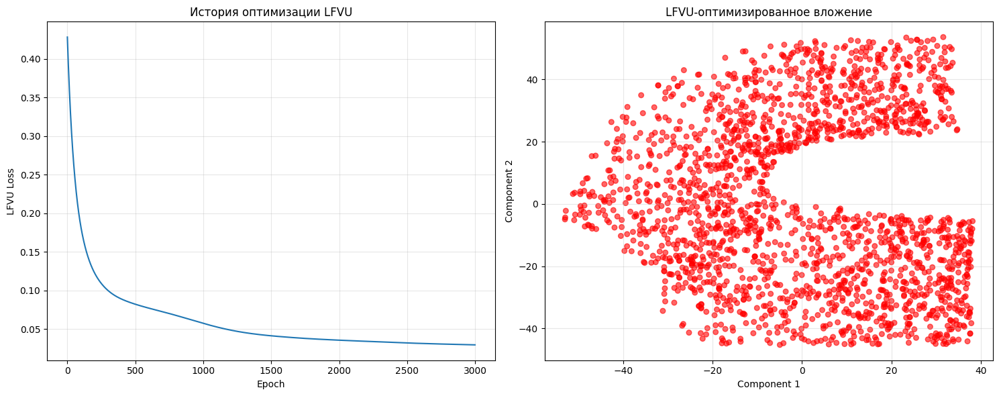

In [ ]:
opt, initial_emb, final_emb, loss_hist, emb_history = LFVU_visualized(X,
                        target_dim=2,
                        k=30,
                        lr=0.01,
                        epochs=3000,
                        init_method='tsne',
                        device='auto')

In [ ]:
emb_hist = {0: initial_emb}
rtd_value = rtd.rtd(X, initial_emb)
rtd_hist = {0: rtd_value}
print(f"RTD for t-SNE embedding: {rtd_value}")

for k in [2, 3, 5, 10, 15, 20, 25, 30, 40, 50, 60, 70, 80, 90, 100]:
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=2,
        k=k,
        lr=0.01,
        epochs=5000,
        init_method="from_emb",
        initial_emb=initial_emb,
        device="cuda")

    print(f"k = {k}. Begin optimization...")
    Y_optimized = lfvu_opt.optimize(verbose=False)

    print("\nOptimization completed!")
    print(f"Final LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    final_emb = lfvu_opt.get_embedding()
    emb_hist[k] = final_emb
    rtd_value = rtd.rtd(X, final_emb)
    rtd_hist[k] = rtd_value

    print(f"k = {k}. Final RTD: {rtd_value}")

RTD for t-SNE embedding: 9.703630447387695
Using device cuda
k = 2. Begin optimization...
Total training time = 9.0280s

Optimization completed!
Final LFVU: 0.116000
k = 2. Final RTD: 9.651453018188477
Using device cuda
k = 3. Begin optimization...
Total training time = 9.0512s

Optimization completed!
Final LFVU: 0.006562
k = 3. Final RTD: 9.421228408813477
Using device cuda
k = 5. Begin optimization...
Total training time = 8.7409s

Optimization completed!
Final LFVU: 0.008142
k = 5. Final RTD: 8.43388557434082
Using device cuda
k = 10. Begin optimization...
Total training time = 9.6813s

Optimization completed!
Final LFVU: 0.009841
k = 10. Final RTD: 7.518177032470703
Using device cuda
k = 15. Begin optimization...
Total training time = 9.1402s

Optimization completed!
Final LFVU: 0.013246
k = 15. Final RTD: 7.526658535003662
Using device cuda
k = 20. Begin optimization...
Total training time = 9.0416s

Optimization completed!
Final LFVU: 0.016367
k = 20. Final RTD: 7.29640579223632

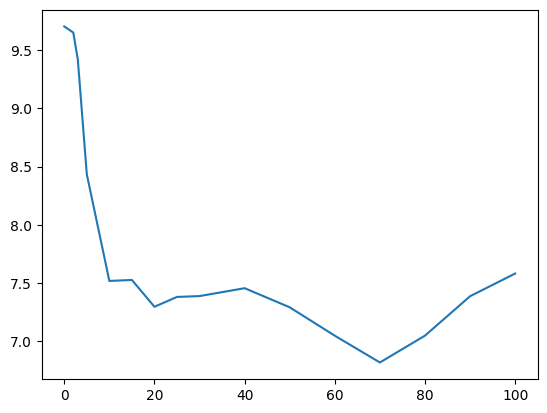

In [ ]:
plt.plot(rtd_hist.keys(), rtd_hist.values())

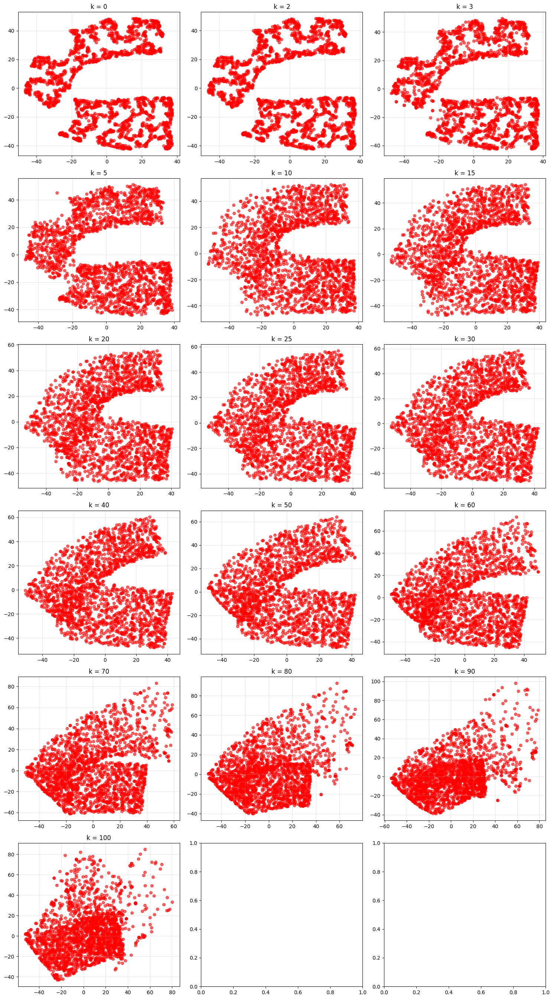

In [ ]:
klfig, axes = plt.subplots(len(emb_hist) // 3 + 1, 3 if umap else 2, figsize=(15, 5 * len(emb_hist) // 3 + 1))
axes = axes.flatten()

colors = ['red'] * len(X)


for idx, (name, Y) in enumerate(emb_hist.items()):
    ax = axes[idx]
    # colors = opt.lfvu_history[name]
    ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
    ax.set_title(f"k = {name}")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
skdim.datasets.BenchmarkManifolds().truth

,Intrinsic Dimension,Number of variables,Description
M1_Sphere,10,11,10D sphere linearly embedded
M2_Affine_3to5,3,5,Affine space
M3_Nonlinear_4to6,4,6,"Concentrated figure, mistakable with a 3D one"
M4_Nonlinear,4,8,Nonlinear manifold
M5a_Helix1d,1,3,1D helix
M5b_Helix2d,2,3,2D helix
M6_Nonlinear,6,36,Nonlinear manifold
M7_Roll,2,3,Swiss Roll
M8_Nonlinear,12,72,Nonlinear (highly curved) manifold
M9_Affine,20,20,Affine space


In [ ]:
bm = skdim.datasets.BenchmarkManifolds().generate(n=1000)
bm.keys()

dict_keys(['M1_Sphere', 'M2_Affine_3to5', 'M3_Nonlinear_4to6', 'M4_Nonlinear', 'M5a_Helix1d', 'M5b_Helix2d', 'M6_Nonlinear', 'M7_Roll', 'M8_Nonlinear', 'M9_Affine', 'M10a_Cubic', 'M10b_Cubic', 'M10c_Cubic', 'M10d_Cubic', 'M11_Moebius', 'M12_Norm', 'M13a_Scurve', 'M13b_Spiral', 'Mbeta', 'Mn1_Nonlinear', 'Mn2_Nonlinear', 'Mp1_Paraboloid', 'Mp2_Paraboloid', 'Mp3_Paraboloid'])

In [ ]:
X = bm["M2_Affine_3to5"]
initial_emb = TSNE(perplexity = 20).fit_transform(X)

In [ ]:
emb_hist = {0: initial_emb}
rtd_value = rtd.rtd(X, initial_emb)
rtd_hist = {0: rtd_value}
print(f"RTD for t-SNE embedding: {rtd_value}")

for k in range(10, 105, 10):
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=2,
        k=k,
        lr=0.01,
        epochs=5000,
        init_method="from_emb",
        initial_emb=initial_emb,
        device="cuda")

    print(f"k = {k}. Begin optimization...")
    Y_optimized = lfvu_opt.optimize(verbose=False)

    print("\nOptimization completed!")
    print(f"Final LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    final_emb = lfvu_opt.get_embedding()
    emb_hist[k] = final_emb
    rtd_value = rtd.rtd(X, final_emb)
    rtd_hist[k] = rtd_value

    print(f"k = {k}. Final RTD: {rtd_value}")

RTD for t-SNE embedding: 14.475481033325195
Using device cuda
k = 10. Begin optimization...
Total training time = 9.1166s

Optimization completed!
Final LFVU: 0.261564
k = 10. Final RTD: 11.167365074157715
Using device cuda
k = 20. Begin optimization...
Total training time = 8.9166s

Optimization completed!
Final LFVU: 0.421058
k = 20. Final RTD: 10.96049690246582
Using device cuda
k = 30. Begin optimization...
Total training time = 8.9670s

Optimization completed!
Final LFVU: 0.455157
k = 30. Final RTD: 10.958002090454102
Using device cuda
k = 40. Begin optimization...
Total training time = 9.0566s

Optimization completed!
Final LFVU: 0.468699
k = 40. Final RTD: 10.802685737609863
Using device cuda
k = 50. Begin optimization...
Total training time = 10.2707s

Optimization completed!
Final LFVU: 0.470590
k = 50. Final RTD: 10.907187461853027
Using device cuda
k = 60. Begin optimization...
Total training time = 8.6895s

Optimization completed!
Final LFVU: 0.480560
k = 60. Final RTD: 10.

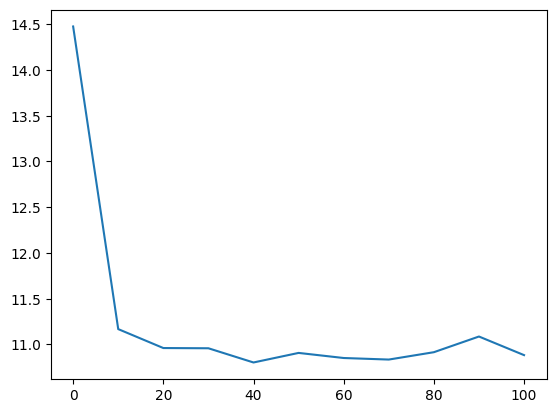

In [ ]:
plt.plot(rtd_hist.keys(), rtd_hist.values())

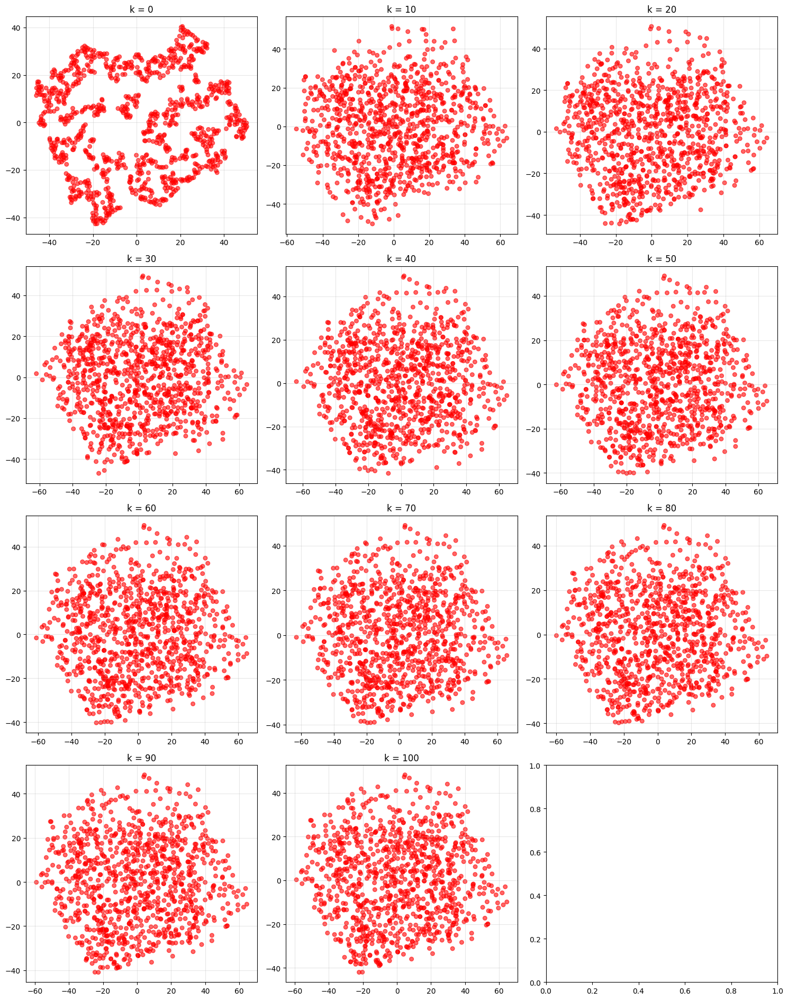

In [ ]:
klfig, axes = plt.subplots(len(emb_hist) // 3 + 1, 3 if umap else 2, figsize=(15, 5 * len(emb_hist) // 3 + 1))
axes = axes.flatten()

colors = ['red'] * len(X)


for idx, (name, Y) in enumerate(emb_hist.items()):
    ax = axes[idx]
    # colors = opt.lfvu_history[name]
    ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
    ax.set_title(f"k = {name}")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Begin t-SNE
t-SNE reduction completed
RTD for t-SNE embedding: 3.7010512351989746
Using device cuda
k = 5. Begin optimization...
Total training time = 9.2468s

Optimization completed!
Final LFVU: 0.000003
k = 5. Final RTD: 3.695291042327881
Using device cuda
k = 10. Begin optimization...
Total training time = 9.4007s

Optimization completed!
Final LFVU: 0.000013
k = 10. Final RTD: 3.6876347064971924
Using device cuda
k = 15. Begin optimization...
Total training time = 9.1115s

Optimization completed!
Final LFVU: 0.000017
k = 15. Final RTD: 3.7358384132385254
Using device cuda
k = 20. Begin optimization...
Total training time = 9.2254s

Optimization completed!
Final LFVU: 0.000025
k = 20. Final RTD: 3.646550416946411
Using device cuda
k = 25. Begin optimization...
Total training time = 9.0191s

Optimization completed!
Final LFVU: 0.000656
k = 25. Final RTD: 2.9620471000671387
Using device cuda
k = 30. Begin optimization...
Total training time = 9.1918s

Optimization completed!
Final LFV

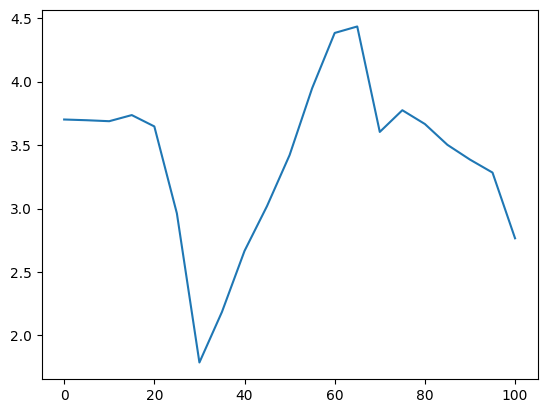

In [ ]:
X = bm["M5a_Helix1d"]
print("Begin t-SNE")
initial_emb = TSNE(perplexity = 20).fit_transform(X)
print("t-SNE reduction completed")
emb_hist = {0: initial_emb}
# lc_value =
# lc_hist = {0: lc_value}
# wd_value =
# wd_hist = {0: wd_value}
rtd_value = rtd.rtd(X, initial_emb)
rtd_hist = {0: rtd_value}

print(f"RTD for t-SNE embedding: {rtd_value}")

for k in range(5, 105, 5):
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=2,
        k=k,
        lr=0.01,
        epochs=5000,
        init_method="from_emb",
        initial_emb=initial_emb,
        device="cuda")

    print(f"k = {k}. Begin optimization...")
    Y_optimized = lfvu_opt.optimize(verbose=False)

    print("\nOptimization completed!")
    print(f"Final LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    final_emb = lfvu_opt.get_embedding()
    emb_hist[k] = final_emb
    # lc_value =
    # lc_hist[k] = lc_value
    # wd_value =
    # wd_hist[k] = wd_value
    rtd_value = rtd.rtd(X, final_emb)
    rtd_hist[k] = rtd_value

    print(f"k = {k}. Final RTD: {rtd_value}")

plt.plot(rtd_hist.keys(), rtd_hist.values())

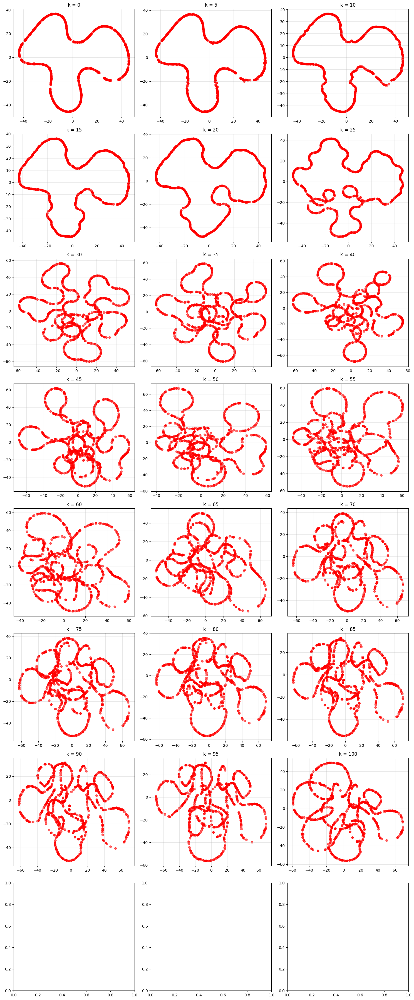

In [ ]:
klfig, axes = plt.subplots(len(emb_hist) // 3 + 1, 3 if umap else 2, figsize=(15, 5 * len(emb_hist) // 3 + 1))
axes = axes.flatten()

colors = ['red'] * len(X)


for idx, (name, Y) in enumerate(emb_hist.items()):
    ax = axes[idx]
    # colors = opt.lfvu_history[name]
    ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
    ax.set_title(f"k = {name}")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Begin t-SNE
t-SNE reduction completed
RTD for t-SNE embedding: 24.934324264526367
Using device cuda
k = 10. Begin optimization...
Total training time = 9.1451s

Optimization completed!
Final LFVU: 0.361631
k = 10. Final RTD: 21.857961654663086
Using device cuda
k = 20. Begin optimization...
Total training time = 11.1875s

Optimization completed!
Final LFVU: 0.571878
k = 20. Final RTD: 21.35466194152832
Using device cuda
k = 30. Begin optimization...
Total training time = 9.1118s

Optimization completed!
Final LFVU: 0.631963
k = 30. Final RTD: 21.254074096679688
Using device cuda
k = 40. Begin optimization...
Total training time = 9.1045s

Optimization completed!
Final LFVU: 0.662592
k = 40. Final RTD: 21.355085372924805
Using device cuda
k = 50. Begin optimization...
Total training time = 9.0360s

Optimization completed!
Final LFVU: 0.669299
k = 50. Final RTD: 21.210561752319336
Using device cuda
k = 60. Begin optimization...
Total training time = 8.7593s

Optimization completed!
Final

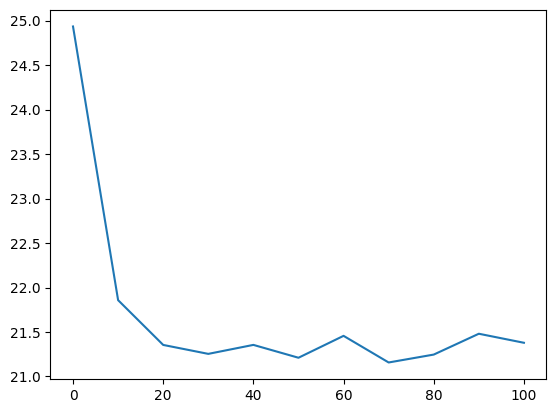

In [ ]:
X = bm["M3_Nonlinear_4to6"]
print("Begin t-SNE")
initial_emb = TSNE(perplexity = 20).fit_transform(X)
print("t-SNE reduction completed")
emb_hist = {0: initial_emb}
rtd_value = rtd.rtd(X, initial_emb)
rtd_hist = {0: rtd_value}
print(f"RTD for t-SNE embedding: {rtd_value}")

for k in range(10, 105, 10):
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=2,
        k=k,
        lr=0.01,
        epochs=5000,
        init_method="from_emb",
        initial_emb=initial_emb,
        device="cuda")

    print(f"k = {k}. Begin optimization...")
    Y_optimized = lfvu_opt.optimize(verbose=False)

    print("\nOptimization completed!")
    print(f"Final LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    final_emb = lfvu_opt.get_embedding()
    emb_hist[k] = final_emb
    rtd_value = rtd.rtd(X, final_emb)
    rtd_hist[k] = rtd_value

    print(f"k = {k}. Final RTD: {rtd_value}")

plt.plot(rtd_hist.keys(), rtd_hist.values())

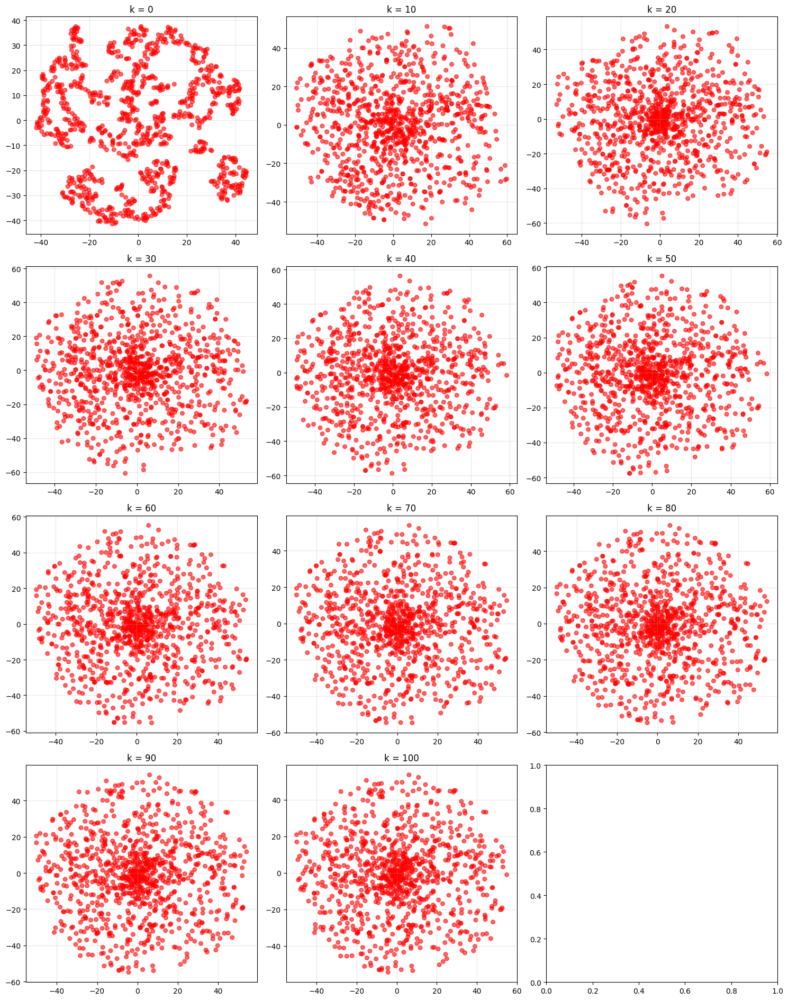

In [ ]:
klfig, axes = plt.subplots(len(emb_hist) // 3 + 1, 3 if umap else 2, figsize=(15, 5 * len(emb_hist) // 3 + 1))
axes = axes.flatten()

colors = ['red'] * len(X)


for idx, (name, Y) in enumerate(emb_hist.items()):
    ax = axes[idx]
    # colors = opt.lfvu_history[name]
    ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
    ax.set_title(f"k = {name}")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Begin t-SNE
t-SNE reduction completed
RTD for t-SNE embedding: 13.618856430053711
Using device cuda
k = 10. Begin optimization...
Total training time = 9.0433s

Optimization completed!
Final LFVU: 0.231658
k = 10. Final RTD: 10.27741527557373
Using device cuda
k = 20. Begin optimization...
Total training time = 8.8530s

Optimization completed!
Final LFVU: 0.369905
k = 20. Final RTD: 9.602544784545898
Using device cuda
k = 30. Begin optimization...
Total training time = 9.0511s

Optimization completed!
Final LFVU: 0.433440
k = 30. Final RTD: 9.446322441101074
Using device cuda
k = 40. Begin optimization...
Total training time = 9.3429s

Optimization completed!
Final LFVU: 0.446393
k = 40. Final RTD: 9.320233345031738
Using device cuda
k = 50. Begin optimization...
Total training time = 8.8984s

Optimization completed!
Final LFVU: 0.460780
k = 50. Final RTD: 9.33964729309082
Using device cuda
k = 60. Begin optimization...
Total training time = 9.1484s

Optimization completed!
Final LFVU:

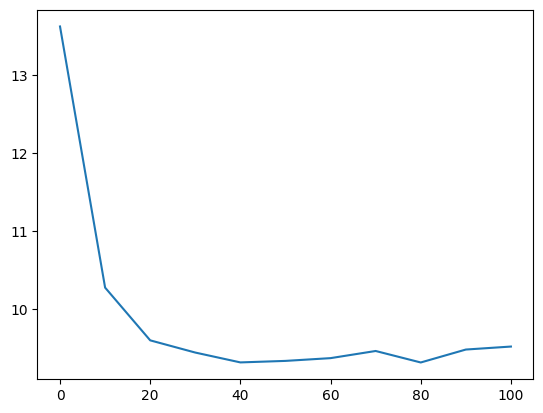

In [ ]:
X = bm["M5b_Helix2d"]
print("Begin t-SNE")
initial_emb = TSNE(perplexity = 20).fit_transform(X)
print("t-SNE reduction completed")
emb_hist = {0: initial_emb}
rtd_value = rtd.rtd(X, initial_emb)
rtd_hist = {0: rtd_value}
lc_hist = {}
print(f"For the t-SNE embedding: RTD = {rtd_value}")

for k in range(10, 105, 10):
    lfvu_opt = LFVUOptimizer(
        X=X,
        target_dim=2,
        k=k,
        lr=0.01,
        epochs=5000,
        init_method="from_emb",
        initial_emb=initial_emb,
        device="cuda")

    print(f"k = {k}. Begin optimization...")
    Y_optimized = lfvu_opt.optimize(verbose=False)

    print("\nOptimization completed!")
    print(f"Final LFVU: {lfvu_opt.loss_history[-1]:.6f}")

    final_emb = lfvu_opt.get_embedding()
    emb_hist[k] = final_emb
    rtd_value = rtd.rtd(X, final_emb)
    rtd_hist[k] = rtd_value

    print(f"k = {k}. Final RTD: {rtd_value}")

plt.plot(rtd_hist.keys(), rtd_hist.values())

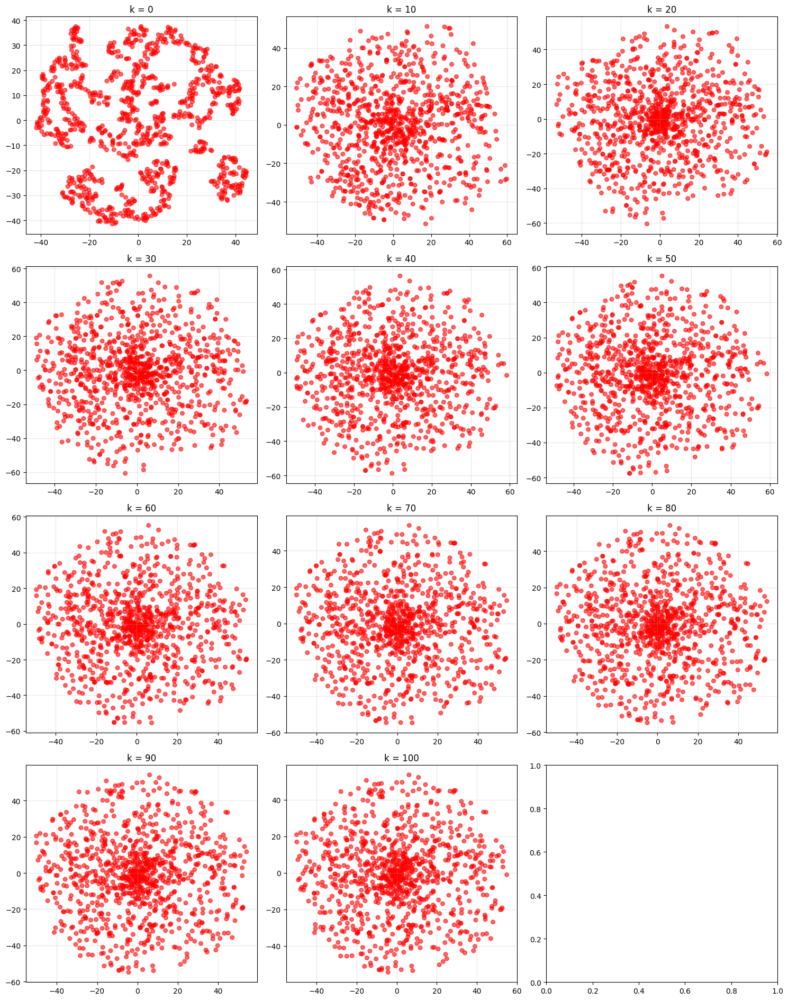

In [ ]:
klfig, axes = plt.subplots(len(emb_hist) // 3 + 1, 3 if umap else 2, figsize=(15, 5 * len(emb_hist) // 3 + 1))
axes = axes.flatten()

colors = ['red'] * len(X)


for idx, (name, Y) in enumerate(emb_hist.items()):
    ax = axes[idx]
    # colors = opt.lfvu_history[name]
    ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
    ax.set_title(f"k = {name}")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
tsne_loss = TSNELoss(device="cuda")
X = torch.tensor(initial_emb, device = "cuda")
kl_history = {i: tsne_loss.compute_tsne_loss(X, torch.tensor(Y, device="cuda")) for i, Y in emb_history.items()}

In [ ]:
kl_hist = {i: kl_history[i][0].item() for i in kl_history}

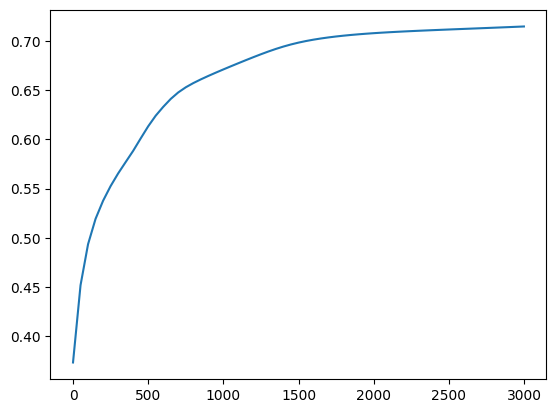

In [ ]:
plt.plot(kl_hist.keys(), kl_hist.values())

In [ ]:
opt, initial_emb, final_emb, loss_hist, emb_history = TSNE_LFVU_visualized(X,
                        target_dim=2,
                        k=5,
                        lr=0.01,
                        epochs=500,
                        init_method='pca',
                        device='auto')

Инициализация LFVU оптимизатора...
Using device cuda
Начало оптимизации...
Epoch    0/500: Total loss = 2.565859, LFVU loss 0.958788, KL-divergence 1.607071


KeyboardInterrupt: 

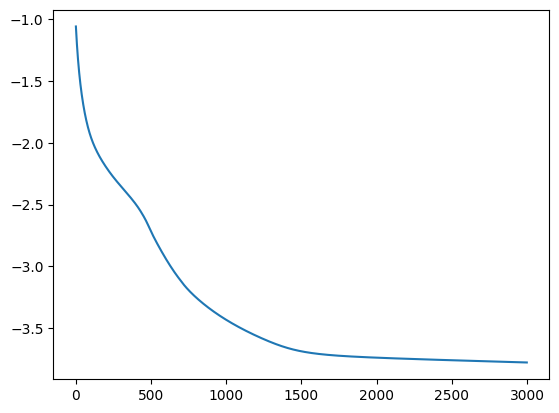

In [ ]:
plt.plot(np.log(loss_hist))

H0: num barcodes 0
H1: num barcodes 28
max0,976Barcode 1 = 0.08678337931632996
maxBarcode 1 = 0.08678337931632996
middleBarcode 1 = 9.009893983602524e-05


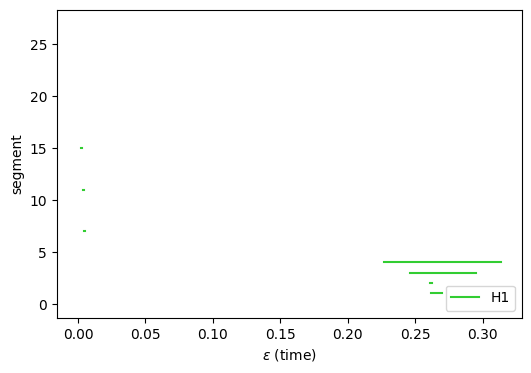

In [ ]:
barc = rtd.calc_embed_dist(X, initial_emb)
rtd.plot_barcodes(rtd.barc2array(barc))

H0: num barcodes 0
H1: num barcodes 4
max0,976Barcode 1 = 0.08454404771327972
maxBarcode 1 = 0.08454404771327972
middleBarcode 1 = 0.05386912822723389


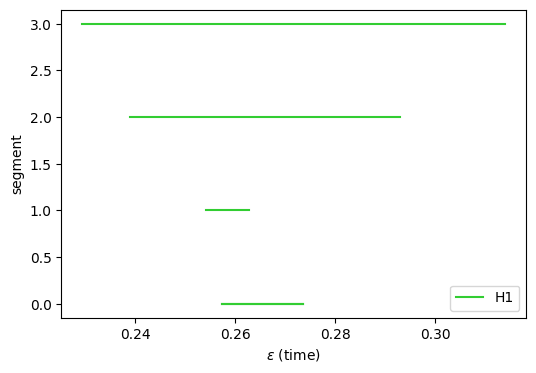

In [ ]:
barc = rtd.calc_embed_dist(X, final_emb)
rtd.plot_barcodes(rtd.barc2array(barc))

In [ ]:
print(rtd.rtd(X, initial_emb), rtd.rtd(X, final_emb))

1.674956 1.1182096


AttributeError: 'TSNE_LFVUOptimizer' object has no attribute 'lfvu_history'

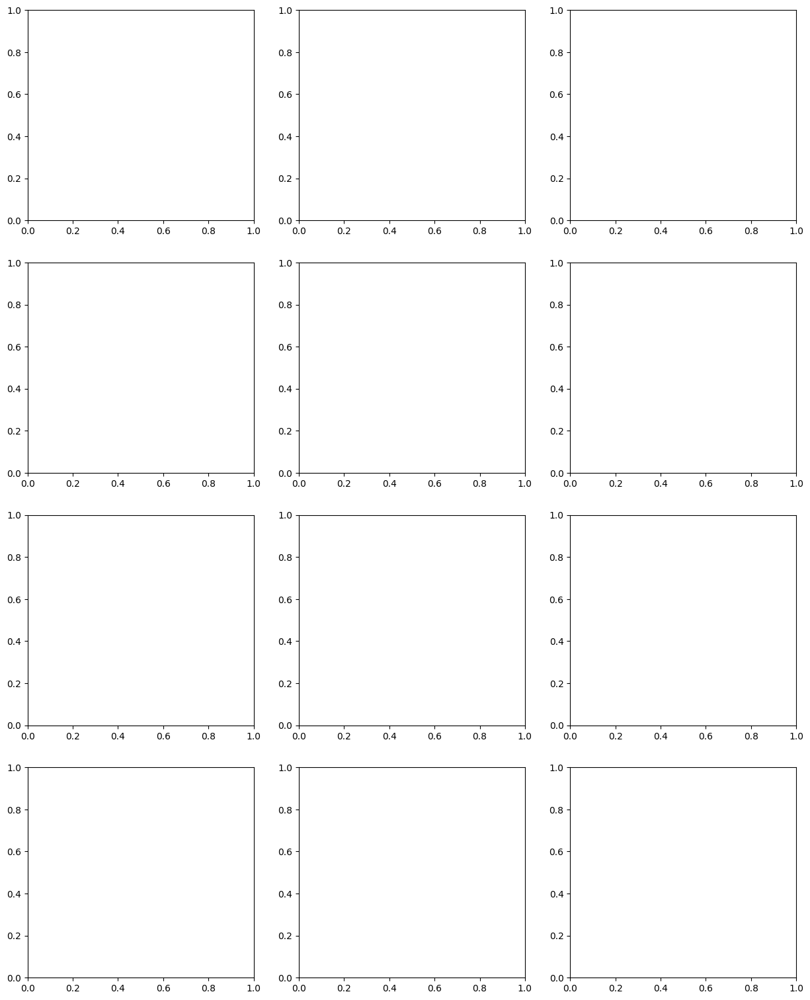

In [ ]:
klfig, axes = plt.subplots(len(emb_history) // 3 + 1, 3 if umap else 2, figsize=(15, 5 * len(emb_history) // 3 + 1))
axes = axes.flatten()

# colors = ['red'] * len(X)


for idx, (name, Y) in enumerate(emb_history.items()):
    ax = axes[idx]
    colors = opt.lfvu_history[name]
    ax.scatter(Y[:, 0], Y[:, 1], c=colors, alpha=0.6, s=30)
    ax.set_title(name)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Using device cuda
Using device cuda
Using device cuda


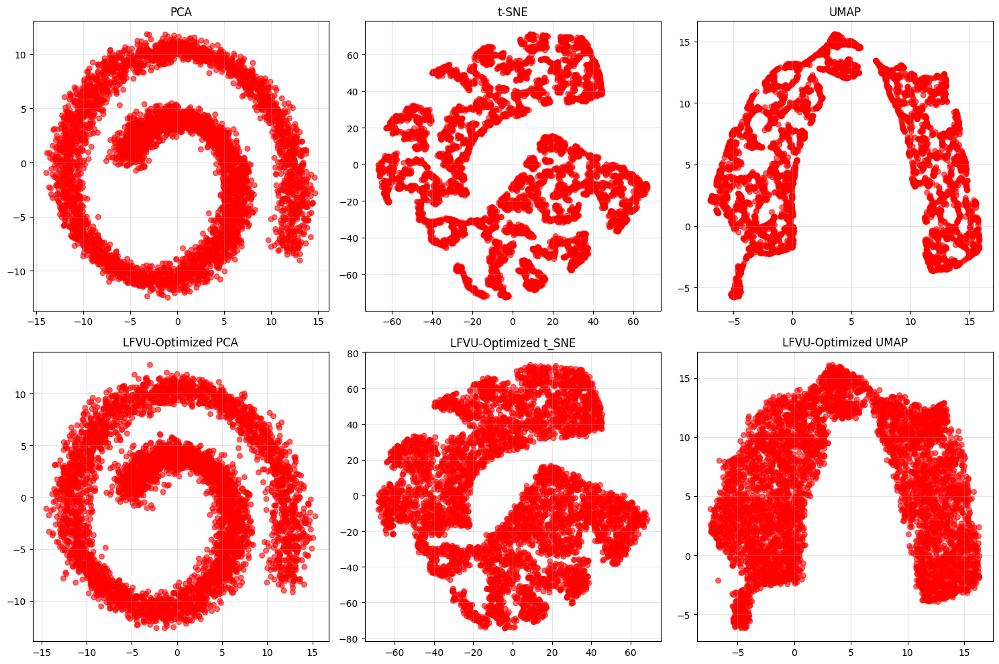

In [ ]:
X, _ = make_swiss_roll(n_samples=5000, noise=0.5)
compare_methods(X)

Посмотреть статьи, провести сравнение по разным метрикам
Посмотреть, что будет, если заменить евклидово расстояние на кратчайшее в графе ближайших соседей
